In [1]:
import os,sys
import cv2
from tqdm import tqdm
import re
import random

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from keras.utils.np_utils import to_categorical


from tensorflow.keras import models, Sequential, layers, regularizers, Model
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import image_dataset_from_directory 
import tensorflow.keras.applications.resnet50 as resnet50

In [3]:
path_train = '/kaggle/input/stanford-dogs-dataset-traintest/cropped/train'
path_test = '/kaggle/input/stanford-dogs-dataset-traintest/cropped/test'

In [4]:
# Preprocess the input images using the ResNet50 preprocess_input function
def preprocess(img, label):
    img = resnet50.preprocess_input(img)
    return img, label

# TRAIN DATASET
train_dataset = image_dataset_from_directory(directory=path_train,
                                      labels='inferred',
                                      label_mode="categorical",
                                      validation_split=0.2,
                                      subset="training",
                                      seed=123,
                                      image_size=(224, 224),
                                      batch_size=32)   

# Preprocess X in the train_dataset
train_ds_prepro = train_dataset.map(preprocess)

###########
# VALIDATION DATASET
val_dataset = image_dataset_from_directory(directory=path_train,
                                      labels='inferred',
                                      label_mode="categorical",
                                      validation_split=0.2,
                                      subset="validation",
                                      seed=123,
                                      image_size=(224, 224),
                                      batch_size=32)
                                         
# Preprocess X in the val_dataset
validation_ds_prepro = val_dataset.map(preprocess)

############
# TEST DATASET
test_dataset = image_dataset_from_directory(directory=path_test,
                                            labels='inferred',
                                            label_mode="categorical",
                                            validation_split=None,
                                            subset=None,
                                            seed=123,
                                            image_size=(224, 224),
                                            batch_size=32) 

# Preprocess X in the test_dataset
test_ds_prepro = test_dataset.map(preprocess)

Found 12000 files belonging to 120 classes.
Using 9600 files for training.
Found 12000 files belonging to 120 classes.
Using 2400 files for validation.
Found 8580 files belonging to 120 classes.


In [5]:
# Check the preprocessed X in the train_dataset
image_batch_train, labels_batch_train = next(iter(train_ds_prepro))
first_image_train = image_batch_train[0]
first_image_train
print("from the train dataset")
print(image_batch_train.shape)
print(np.min(first_image_train), np.max(first_image_train))

# Check the preprocessed X in the val_dataset
image_batch_val, labels_batch_val = next(iter(validation_ds_prepro))
first_image_val = image_batch_val[0]
first_image_val
print("from the val dataset")
print(image_batch_val.shape)
print(np.min(first_image_val), np.max(first_image_val))

# Check the preprocessed X in the test_dataset
image_batch_test, labels_batch_test = next(iter(test_ds_prepro))
first_image_test = image_batch_test[0]
first_image_test
print("from the test dataset")
print(image_batch_test.shape)
print(np.min(first_image_test), np.max(first_image_test))

from the train dataset
(32, 224, 224, 3)
-123.68 148.061
from the val dataset
(32, 224, 224, 3)
-123.68 127.32
from the test dataset
(32, 224, 224, 3)
-107.68 151.061


# Base model = ResNet50

In [6]:
# Load the ResNet50 model pre-trained on ImageNet
base_model = resnet50.ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# Freeze the base model layers to prevent them from being updated during training
base_model.trainable = False

94765736/94765736 [==============================] - 3s 0us/step


# Visualize the activations (ResNet50)

In [7]:
def compute_convolution(input_image, kernel):
    # Parameters
    kernel = np.array(kernel)
    kernel_height, kernel_width = kernel.shape

    img = input_image[:,:,0]     # Removes the color dimensions of size 3  >> shape: (224, 224)
    img_height, img_width = img.shape     #(224, 224)
    
    output_image = []

    for x in range(img_height - kernel_height + 1):     #218
        arr = []
        
        for y in range(img_width - kernel_width + 1):   #218
            
            a = np.multiply(img[x: x + kernel_height, y: y + kernel_width],
                            kernel)
            arr.append(a.sum())
            
        output_image.append(arr)
        
    return output_image

In [8]:
def plot_convolution(img, kernel, activation=False):
    ''' The following printing function ease the visualization'''
    
    output_img = compute_convolution(img, kernel)
    if activation:
        output_img = np.maximum(output_img, 0)
    
    plt.figure(figsize=(10, 5))
    
    ax1 = plt.subplot2grid((3,3),(0,0), rowspan=3)
    ax1.imshow(img, cmap=None)
    ax1.title.set_text('Input image')
    
    ax2 = plt.subplot2grid((3,3),(1, 1))
    ax2.imshow(kernel, cmap=None)
    ax2.title.set_text('Kernel')    
    
    ax3 = plt.subplot2grid((3,3),(0, 2), rowspan=3)
    ax3.imshow(output_img, cmap=None)
    ax3.title.set_text('Output image')    

    for ax in [ax1, ax2, ax3]:
        ax.axes.get_xaxis().set_visible(False)
        ax.axes.get_yaxis().set_visible(False)
        
    plt.show()

### An overview of the ResNet50's layers

In [9]:
base_model.summary()
base_model.layers

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [10]:
[layer.output for layer in base_model.layers] 

[<KerasTensor: shape=(None, 224, 224, 3) dtype=float32 (created by layer 'input_1')>,
 <KerasTensor: shape=(None, 230, 230, 3) dtype=float32 (created by layer 'conv1_pad')>,
 <KerasTensor: shape=(None, 112, 112, 64) dtype=float32 (created by layer 'conv1_conv')>,
 <KerasTensor: shape=(None, 112, 112, 64) dtype=float32 (created by layer 'conv1_bn')>,
 <KerasTensor: shape=(None, 112, 112, 64) dtype=float32 (created by layer 'conv1_relu')>,
 <KerasTensor: shape=(None, 114, 114, 64) dtype=float32 (created by layer 'pool1_pad')>,
 <KerasTensor: shape=(None, 56, 56, 64) dtype=float32 (created by layer 'pool1_pool')>,
 <KerasTensor: shape=(None, 56, 56, 64) dtype=float32 (created by layer 'conv2_block1_1_conv')>,
 <KerasTensor: shape=(None, 56, 56, 64) dtype=float32 (created by layer 'conv2_block1_1_bn')>,
 <KerasTensor: shape=(None, 56, 56, 64) dtype=float32 (created by layer 'conv2_block1_1_relu')>,
 <KerasTensor: shape=(None, 56, 56, 64) dtype=float32 (created by layer 'conv2_block1_2_conv

### Visualize the impact of one kernel of the first convolutional layer

In [11]:
# Accessing the first convolutional layer
first_convolutional_layer = base_model.layers[2]
print(first_convolutional_layer) 
print(first_convolutional_layer.output)

# Weights of the first convolutional layer 
first_convolutional_layer.weights[0].shape

# Biases of the first convolutional layer 
first_convolutional_layer.weights[1].shape

KerasTensor(type_spec=TensorSpec(shape=(None, 112, 112, 64), dtype=tf.float32, name=None), name='conv1_conv/BiasAdd:0', description="created by layer 'conv1_conv'")


TensorShape([64])

In [13]:
# Choose a kernel from the first convolutional layer

kernel = first_convolutional_layer.weights[0].numpy()[:, :, 0, 0]
print(f"kernel: {kernel.shape}")

# Choose the first image (preprocessed) from the train dataset
first_image_train
print(f"image: {first_image_train.shape}")

kernel: (7, 7)
image: (224, 224, 3)


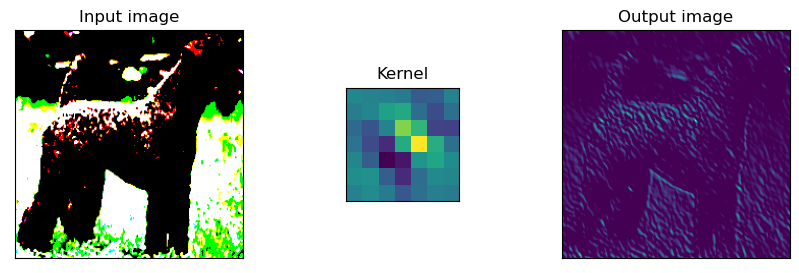

In [14]:
plot_convolution(first_image_train, kernel, activation=True)

### Visualize the activation of an image after every convolutional layer 


In [15]:
# 1-listing all the layers' outputs 
layers_outputs = [layer.output for layer in base_model.layers] 

# 2-Instantiate 11 sub-models re-using already trained weights and biases
activation_model = Model(inputs=base_model.input, outputs=layers_outputs) # model with many outputs !

# 3-Compute the outputs of each submodel
activations = activation_model.predict(image_batch_train) # 11 predictions at once!    #same as activations = [m.predict(X) for m in activation_models]
[activation.shape for activation in activations]

1/1 [==============================] - 6s 6s/step


[(32, 224, 224, 3),
 (32, 230, 230, 3),
 (32, 112, 112, 64),
 (32, 112, 112, 64),
 (32, 112, 112, 64),
 (32, 114, 114, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 64),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 56, 56, 256),
 (32, 28, 28, 128),
 (32, 28, 28, 128),
 (32, 28, 28, 128),
 (32, 28, 28, 128),
 (32, 28, 28, 128),
 (32, 28, 28, 128),
 (32, 28, 28, 512),
 (32, 28, 28, 512),
 (32, 28, 28, 512),
 (32, 28, 28, 512),
 (32, 28, 28, 512),
 (32, 28, 28, 5

In [16]:
# List indices of the convolutional layers in ResNet50
convolutional_layers = []
for i, layer in enumerate(base_model.layers):
    if "convolutional" in str(layer):
        convolutional_layers .append(i)
print(convolutional_layers )

[2, 7, 10, 13, 14, 19, 22, 25, 29, 32, 35, 39, 42, 45, 46, 51, 54, 57, 61, 64, 67, 71, 74, 77, 81, 84, 87, 88, 93, 96, 99, 103, 106, 109, 113, 116, 119, 123, 126, 129, 133, 136, 139, 143, 146, 149, 150, 155, 158, 161, 165, 168, 171]


--- Observing the effect of the convolutional layer number 2... ---

64 kernels were applied and here are all the activations of this Conv2D Layer:


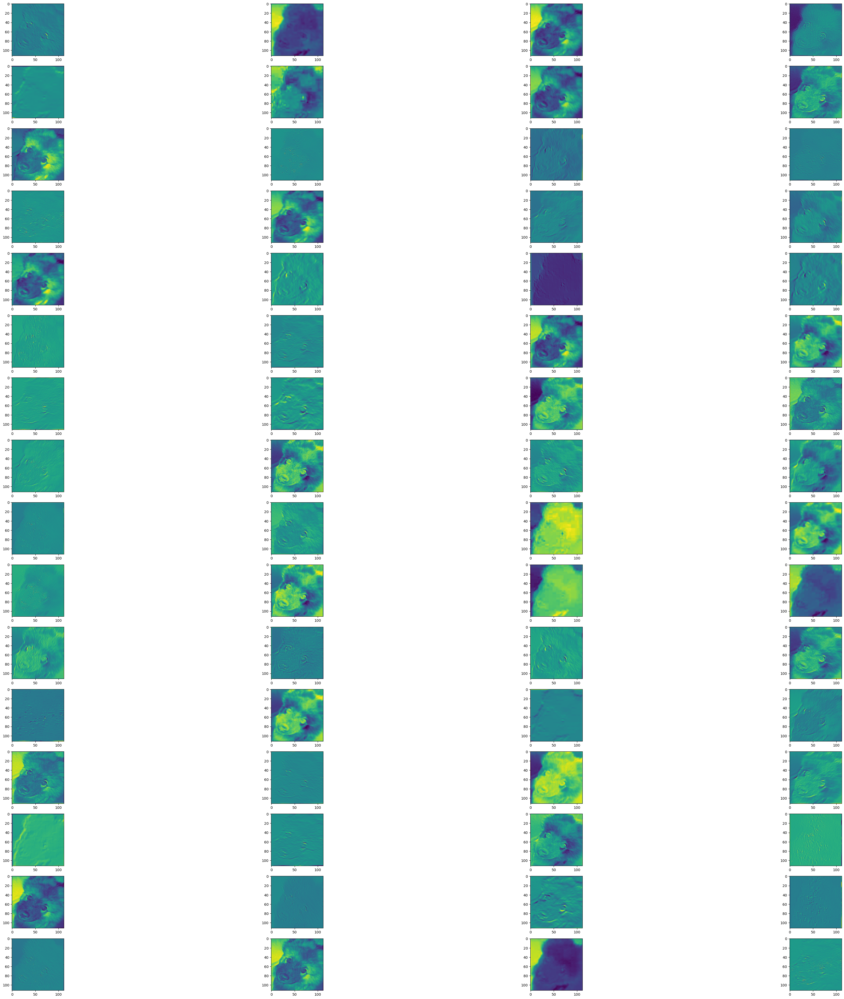

--- Observing the effect of the convolutional layer number 7... ---

64 kernels were applied and here are all the activations of this Conv2D Layer:


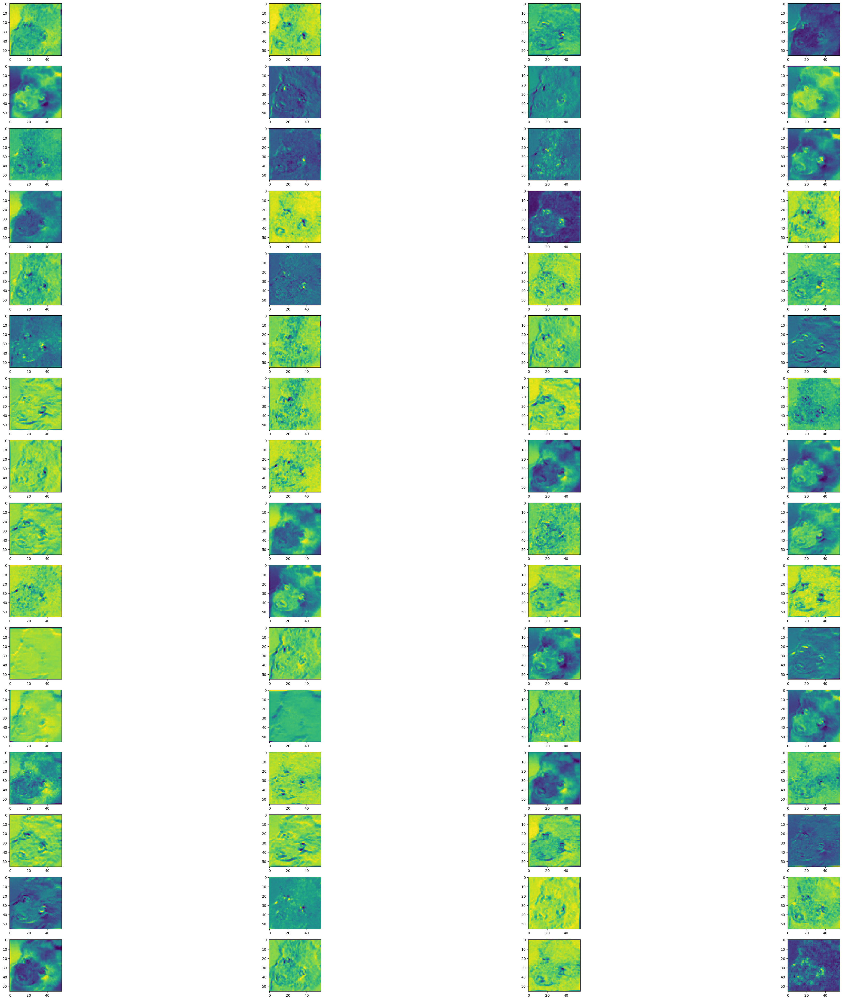

--- Observing the effect of the convolutional layer number 10... ---

64 kernels were applied and here are all the activations of this Conv2D Layer:


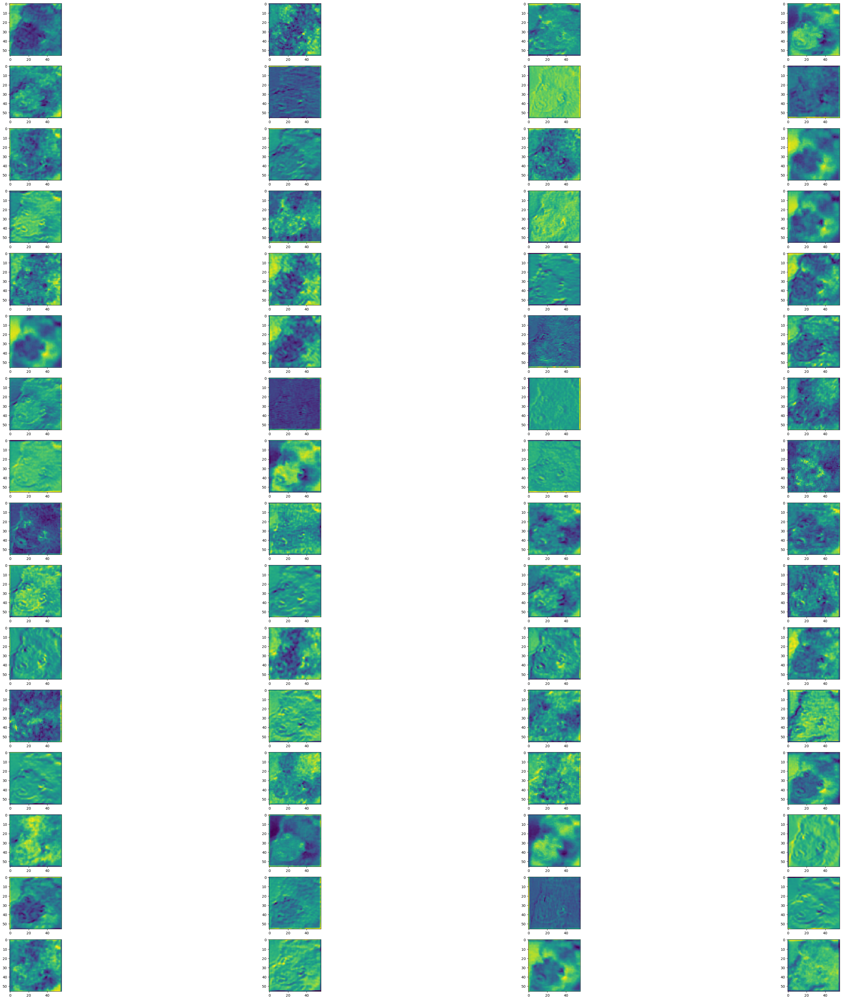

--- Observing the effect of the convolutional layer number 13... ---

256 kernels were applied and here are all the activations of this Conv2D Layer:


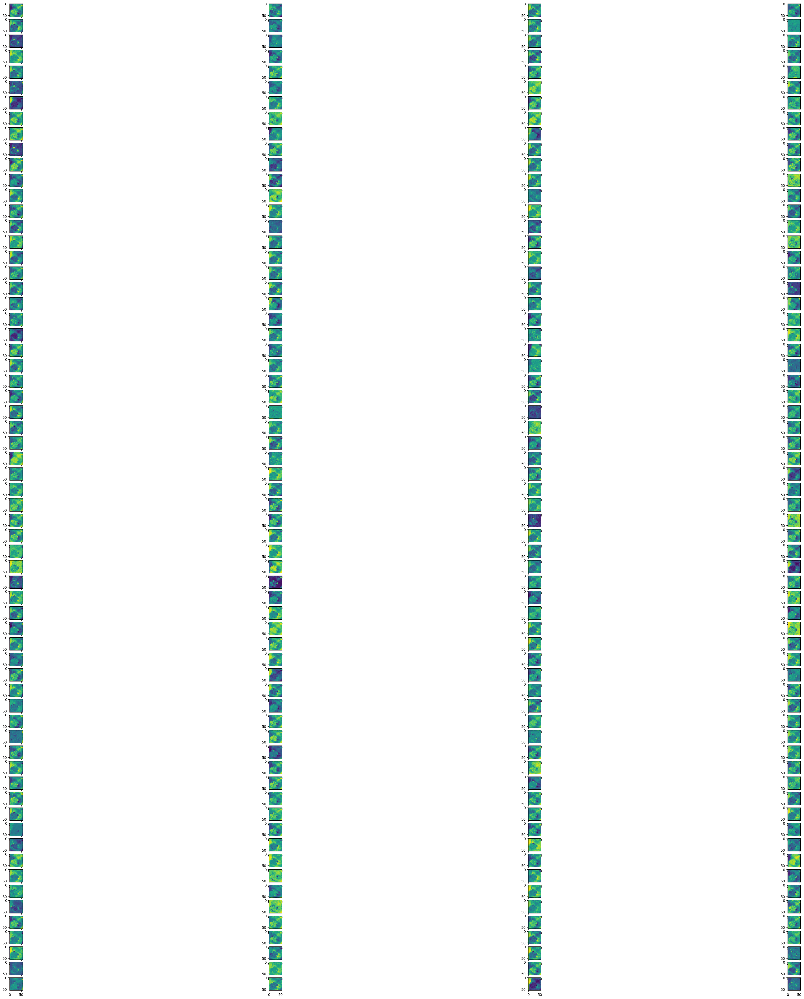

In [17]:
# Selecting a random image from a batch (batchsize=32) from the train dataset
# and visualizing the effect of some convolutional layers

image_number = np.random.choice(np.where(labels_batch_train)[0]) 

for layer_number in [2,7,10,13]:
    
    print(f"--- Observing the effect of the convolutional layer number {layer_number}... ---")
    print("")
    
    temp_number_kernels = base_model.layers[layer_number].weights[0].shape[-1]
    print(f"{temp_number_kernels} kernels were applied and here are all the activations of this Conv2D Layer:")
    
    fig, axes = plt.subplots(int(temp_number_kernels/4),4, figsize=(50,50))
    
    
    for ax, kernel_number in zip(axes.flat,range(temp_number_kernels)):
        activation = activations[layer_number][image_number][:, :, kernel_number]
        ax.imshow(activation, cmap=None)
    
    plt.show()